# AI Design2 -  TransferLearning practice (FineTuning)

---



**1. Import library & random seed fix**

> Import libraries

In [ ]:
print('hi')

hi


In [ ]:
import tensorflow

In [ ]:
#import tensorflow
from tensorflow import keras
from keras.models import load_model
from tensorflow.keras.utils import plot_model
import datetime, os
import matplotlib.pyplot as plt
from keras.layers import Dense, Activation
import random
import numpy as np
import os

> Random seed fix

In [ ]:
def seed_everything(seed: int = 42):
    random.seed(seed)
    np.random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    tensorflow.random.set_seed(seed)

seed_everything()

**2. Load data**

>
> keras.utils.image_dataset_from_directory reference manual
>
> https://www.tensorflow.org/api_docs/python/tf/keras/utils/image_dataset_from_directory
>

> 1) 구글드라이브 마운트

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


> 2) 모델 로드

In [ ]:
transferModel = load_model('/content/drive/MyDrive/TransferLearning/AIDesign2_TransferLearning2(FinalModel)_6.h5')

> 3) 데이터 로드

In [ ]:
train_ds = keras.utils.image_dataset_from_directory(
    directory='/content/drive/MyDrive/TransferLearning/Training/',
    labels='inferred',
    label_mode='int',
    batch_size=32,
    seed=42,
    image_size=(224,224))

validation_ds = keras.utils.image_dataset_from_directory(
    directory='/content/drive/MyDrive/TransferLearning/Validation/',
    labels='inferred',
    label_mode='int',
    batch_size=32,
    seed=42,
    image_size=(224,224))

test_ds = keras.utils.image_dataset_from_directory(
    directory='/content/drive/MyDrive/TransferLearning/Test/',
    labels='inferred',
    label_mode='int',
    batch_size=32,
    seed=42,
    image_size=(224,224))

Found 213 files belonging to 2 classes.
Found 40 files belonging to 2 classes.
Found 40 files belonging to 2 classes.


> 4) **모델 unfreeze**

In [ ]:
transferModel.trainable = True

**3. Fine-tunning**

> 1) Optimizing parameter setting
>
> * **Learning rate는 modeling 할 때의 learning rate보다 작게 쓰는 것을 추천함**

In [ ]:
transferModel.compile(optimizer=tensorflow.keras.optimizers.Adam(learning_rate=0.0001), loss='sparse_categorical_crossentropy',metrics=["sparse_categorical_accuracy"]) # add metrics

> 2) Epoch 별 performance 확인을 위한 세팅

In [ ]:
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = tensorflow.keras.callbacks.TensorBoard(logdir, histogram_freq=1)

> 3) 일정기간동안 더 좋은 모델을 찾지 못하면 자동으로 stop, Validation loss가 가장 작은 모델 저장


In [ ]:
earlyStopping = tensorflow.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20, verbose=0, mode='min')
mcp_save = tensorflow.keras.callbacks.ModelCheckpoint('/content/drive/MyDrive/TransferLearning/AIDesign2_TransferLearning(FineTuning_BestValLoss)_5.h5', save_best_only=True, monitor='val_loss', mode='min')

> 4) Fine tunning start

In [ ]:
history = transferModel.fit(train_ds, epochs=10, validation_data=validation_ds,callbacks=[tensorboard_callback, earlyStopping, mcp_save])

Epoch 1/10
7/7 [==============================] - 32s 1s/step - loss: 0.5171 - sparse_categorical_accuracy: 0.8826 - val_loss: 0.4708 - val_sparse_categorical_accuracy: 0.9750
Epoch 2/10
7/7 [==============================] - 19s 1s/step - loss: 0.4500 - sparse_categorical_accuracy: 1.0000 - val_loss: 0.4461 - val_sparse_categorical_accuracy: 1.0000
Epoch 3/10
7/7 [==============================] - 18s 1s/step - loss: 0.4468 - sparse_categorical_accuracy: 1.0000 - val_loss: 0.4455 - val_sparse_categorical_accuracy: 1.0000
Epoch 4/10
7/7 [==============================] - 19s 1s/step - loss: 0.4450 - sparse_categorical_accuracy: 1.0000 - val_loss: 0.4448 - val_sparse_categorical_accuracy: 1.0000
Epoch 5/10
7/7 [==============================] - 19s 1s/step - loss: 0.4445 - sparse_categorical_accuracy: 1.0000 - val_loss: 0.4443 - val_sparse_categorical_accuracy: 1.0000
Epoch 6/10
7/7 [==============================] - 19s 1s/step - loss: 0.4440 - sparse_categorical_accuracy: 1.0000 - val

> 5) 최종 performance 확인

In [ ]:
scoreTrain = transferModel.evaluate(train_ds)
print("Training loss:", scoreTrain[0])
print("Training accuracy:", scoreTrain[1])

scoreValid = transferModel.evaluate(validation_ds)
print("Validation loss:", scoreValid[0])
print("Validation accuracy:", scoreValid[1])

scoreTest = transferModel.evaluate(test_ds)
print("Test loss:", scoreTest[0])
print("Test accuracy:", scoreTest[1])

7/7 [==============================] - 13s 54ms/step - loss: 0.4416 - sparse_categorical_accuracy: 1.0000
Training loss: 0.44159457087516785
Training accuracy: 1.0
2/2 [==============================] - 2s 23ms/step - loss: 0.4418 - sparse_categorical_accuracy: 1.0000
Validation loss: 0.44177931547164917
Validation accuracy: 1.0
2/2 [==============================] - 2s 22ms/step - loss: 0.4418 - sparse_categorical_accuracy: 1.0000
Test loss: 0.4417807459831238
Test accuracy: 1.0


6) 최종 모델 저장

In [ ]:
transferModel.save('/content/drive/MyDrive/TransferLearning/AIDesign2_TransferLearning(FineTuning_FinalModel)_3.h5')

**4. 분류결과확인**

> 1) Label setting

In [ ]:
CLASSES = ['dot_line','solid_line']

> 2) Define functoin

In [ ]:
def title_from_label_and_target(label, correct_label):
  correct = (label == correct_label)
  return "{} [{}]".format(CLASSES[label], str(correct)), correct

def display_one(image, title, subplot, red=False):
    plt.subplot(10,5,subplot)
    plt.axis('off')
    plt.imshow(image.astype("uint8"))
    plt.title(title, fontsize=16, color='red' if red else 'black')
    return subplot+1


def display_images_with_predictions(images, predictions, labels):
  subplot=1
  plt.figure(figsize=(15,30))#,dpi= 100,)
  classes = np.argmax(predictions, axis=-1)
  for i, image in enumerate(images):
    title, correct = title_from_label_and_target(classes[i], labels[i])
    subplot = display_one(image, title, subplot, not correct)
    if i >= 49:
      break;

  plt.subplots_adjust(wspace=0.2, hspace=0.2)
  plt.show()


> 3) Draw figure

3/3 [==============================] - 1s 47ms/step


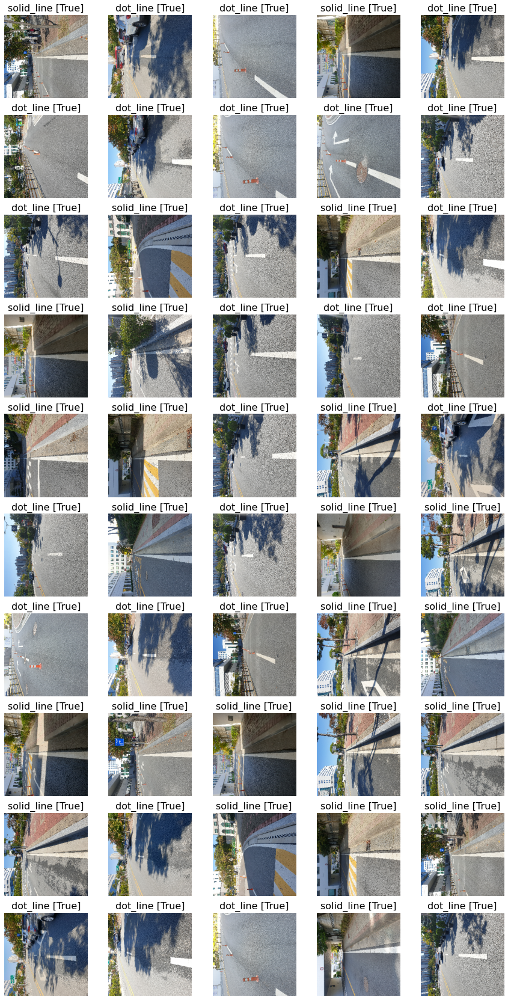

In [ ]:
for x, y in train_ds.take(1):
  images = x[:].numpy().astype("uint8")
  labels = y[:].numpy()

for x, y in train_ds.take(2):
  images = np.concatenate((images,x[:].numpy().astype("uint8")),axis=0)
  labels = np.concatenate((labels,y[:].numpy()),axis=0)

predictions = transferModel.predict(images)

display_images_with_predictions(images, predictions, labels)

3/3 [==============================] - 1s 46ms/step


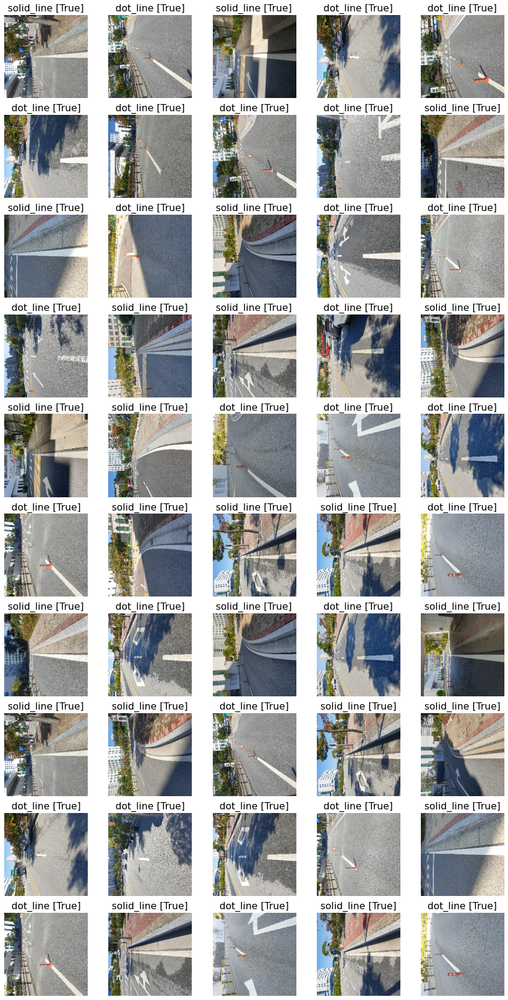

In [ ]:
for x, y in validation_ds.take(1):
  images2 = x[:].numpy().astype("uint8")
  labels2 = y[:].numpy()

for x, y in validation_ds.take(2):
  images2 = np.concatenate((images2,x[:].numpy().astype("uint8")),axis=0)
  labels2 = np.concatenate((labels2,y[:].numpy()),axis=0)

predictions2 = transferModel.predict(images2)

display_images_with_predictions(images2, predictions2, labels2)

3/3 [==============================] - 0s 48ms/step


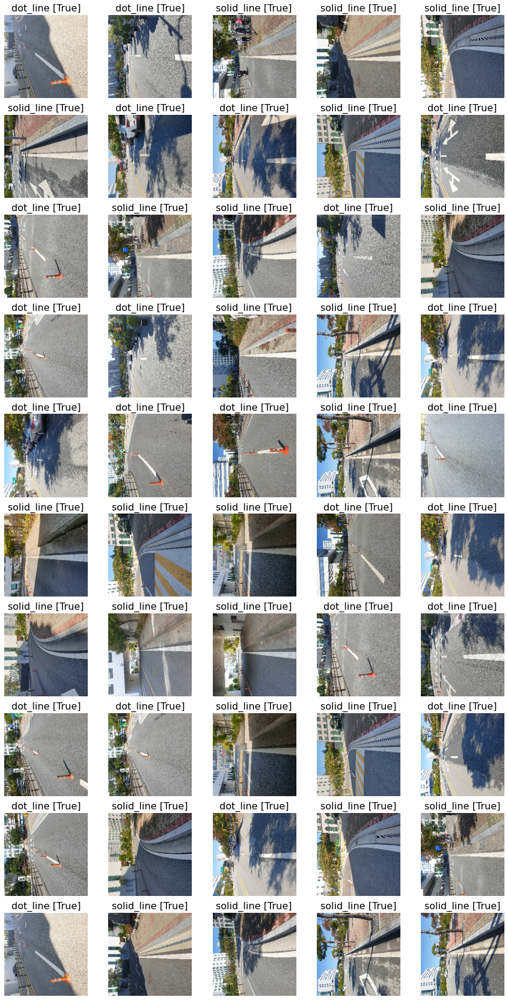

In [ ]:
for x, y in test_ds.take(1):
  images3 = x[:].numpy().astype("uint8")
  labels3 = y[:].numpy()

for x, y in test_ds.take(2):
  images3 = np.concatenate((images3,x[:].numpy().astype("uint8")),axis=0)
  labels3 = np.concatenate((labels3,y[:].numpy()),axis=0)

predictions2 = transferModel.predict(images3)

display_images_with_predictions(images3, predictions2, labels3)

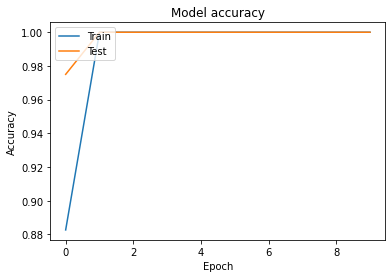

In [ ]:
plt.plot(history.history['sparse_categorical_accuracy'])
plt.plot(history.history['val_sparse_categorical_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

In [ ]:
%load_ext tensorboard
%tensorboard --logdir {logdir}

<IPython.core.display.Javascript object>